<a href="https://colab.research.google.com/github/JohnalEco/Hurtos_Medellin/blob/main/Machine_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
hurto_a_persona = pd.read_csv("/content/hurto_a_persona.csv")
hurto_a_persona['fecha_hecho'] = pd.to_datetime(hurto_a_persona['fecha_hecho'])
hurto_a_persona.head(10)


<ipython-input-3-7efc22b8a8fa>:1: DtypeWarning: Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.
  hurto_a_persona = pd.read_csv("/content/hurto_a_persona.csv")


,fecha_hecho,cantidad,latitud,longitud,sexo,edad,estado_civil,grupo_actor,actividad_delictiva,parentesco,...,lugar,sede_receptora,bien,categoria_bien,grupo_bien,modelo,color,permiso,unidad_medida,fecha_ingestion
0,2017-01-01 01:00:00-05:00,1.0,6.299703,-75.582016,Mujer,33,Unión marital de hecho,Sin dato,Sin dato,Sin dato,...,Vía pública,Doce de Octubre,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
1,2017-01-01 15:00:00-05:00,1.0,6.250917,-75.566160,Mujer,26,Soltero(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Candelaria,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
2,2017-01-01 14:00:00-05:00,1.0,6.274836,-75.554909,Hombre,30,Soltero(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Aranjuez,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
3,2017-01-01 16:00:00-05:00,1.0,6.276236,-75.553533,Hombre,37,Casado(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Aranjuez,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
4,2017-01-01 16:00:00-05:00,1.0,6.250339,-75.586914,Hombre,87,Casado(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Laureles,Billetera,Prendas de vestir y accesorios,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
5,2017-01-01 16:00:00-05:00,1.0,6.219071,-75.602996,Mujer,29,Unión marital de hecho,Sin dato,Sin dato,Sin dato,...,Vía pública,Belén,Elementos escolares,Elementos escolares,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
6,2017-01-01 20:30:00-05:00,1.0,6.317709,-75.678259,Hombre,27,Soltero(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Doce de Octubre,Cámara,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
7,2017-01-01 16:00:00-05:00,1.0,6.268307,-75.558457,Hombre,36,Soltero(a),Sin dato,Sin dato,Sin dato,...,Hospital o centro de salud,Aranjuez,Peso,"Dinero, joyas, piedras preciosas y título valor",Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
8,2017-01-01 00:30:00-05:00,1.0,6.242797,-75.554797,Hombre,41,Casado(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Buenos Aires,Peso,"Dinero, joyas, piedras preciosas y título valor",Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
9,2017-01-01 08:00:00-05:00,1.0,6.246823,-75.562114,Hombre,59,Soltero(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Candelaria,Peso,"Dinero, joyas, piedras preciosas y título valor",Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00


In [4]:
mapeo_categorias = {
    'Vía pública': 'Transporte',
    'Terminal de transporte': 'Transporte',
    'Estación del Metro': 'Transporte',
    'Estación del Metro plus': 'Transporte',
    'Paradero de bus': 'Transporte',
    'Aeropuerto': 'Transporte',
    'Puente peatonal': 'Transporte',
    'Metro Plus': 'Transporte',
    'Peaje': 'Transporte',
    'Institución de educación superior': 'Educación',
    'Institución educativa (jardín, primaria o secundaria)': 'Educación',
    'Residencia': 'Residencial',
    'Casa o apartamento': 'Residencial',
    'Conjunto residencial': 'Residencial',
    'Caseta vigilancia conjunto residencial': 'Residencial',
    'Centro comercial': 'Comercial',
    'Local comercial': 'Comercial',
    'Supermercado': 'Comercial',
    'Almacén tienda y otro': 'Comercial',
    'Plaza de mercado': 'Comercial',
    'Joyería': 'Comercial',
    'Compraventa': 'Comercial',
    'Bar o cantina': 'Entretenimiento',
    'Casino': 'Entretenimiento',
    'Teatro': 'Entretenimiento',
    'Parque': 'Entretenimiento',
    'Escenario deportivo': 'Entretenimiento',
    'Gimnasio': 'Entretenimiento',
    'Estadero': 'Entretenimiento',
    'Hospital o centro de salud': 'Salud',
    'Oficina': 'Servicios',
    'Hotel, motel y hostal': 'Servicios',
    'Restaurante': 'Servicios',
    'Taller mecánico': 'Servicios',
    'Droguería o farmacia': 'Servicios',
    'Biblioteca': 'Servicios',
    'Cementerio': 'Servicios',
    'Instalación judicial': 'Servicios',
    'Panadería': 'Servicios',
    'Instalación fuerza pública': 'Servicios',
    'Sede social, club, auditorio o similar': 'Servicios',
    'Funeraria y sala de velación': 'Servicios',
    'Baño': 'Servicios',
    'Sede política': 'Servicios',
    'Cafetería': 'Servicios',
    'Café internet': 'Servicios',
    'Consultorio jurídico': 'Servicios',
    'Lavadero de carros': 'Servicios',
    'Obra en construcción': 'Otros',
    'Quebrada o rio': 'Otros',
    'Reserva natural': 'Otros',
    'Lote baldío': 'Otros',
    'Potrero': 'Otros',
    'Matadero, carnicería y similar': 'Otros',
    'Hipodromo': 'Otros',
    'Cantera': 'Otros',
    'Finca': 'Otros',
    'Feria de ganado': 'Otros',
    'Desguazadero': 'Otros',
    'Sin dato': 'Otros'
}

hurto_a_persona['lugar_agrupado'] = hurto_a_persona['lugar'].map(mapeo_categorias)

In [5]:
datos_limpios = hurto_a_persona.dropna(subset=['latitud', 'longitud'])
datos_limpios = datos_limpios[(datos_limpios['latitud'] != 0) & (datos_limpios['longitud'] != 0)]

In [6]:
#Cargar el archivo shp
barrios = gpd.read_file("/content/BarrioVereda_2014.shp")
barrios.head(5)

,CODIGO,NOMBRE,ABREVIATUR,IDENTIFICA,LIMITECOMU,ZHFISICAGE,LIMITEMUNI,VIGENCIA_F,SUBTIPO_BA,LINK_DOCUM,geometry
0,Inst_15,U.P.B,None,Inst_15,11,None,001,None,1,None,"POLYGON ((-75.58911 6.24447, -75.58900 6.24443..."
1,Inst_18,Cerro Nutibara,None,Inst_18,16,None,001,None,1,None,"POLYGON ((-75.57669 6.23733, -75.57628 6.23612..."
2,0610,Mirador del Doce,None,0610,06,None,001,None,1,None,"POLYGON ((-75.58450 6.30520, -75.58445 6.30519..."
3,1620,El Nogal-Los Almendros,None,1620,16,None,001,None,1,None,"POLYGON ((-75.59551 6.23662, -75.59552 6.23660..."
4,0612,El Triunfo,None,0612,06,None,001,None,1,None,"POLYGON ((-75.58618 6.31007, -75.58616 6.31007..."


In [7]:
gdf_hurtos = gpd.GeoDataFrame(datos_limpios, geometry=gpd.points_from_xy(datos_limpios.longitud, datos_limpios.latitud), crs='EPSG:4326')
gdf_hurtos.head(5)

,fecha_hecho,cantidad,latitud,longitud,sexo,edad,estado_civil,grupo_actor,actividad_delictiva,parentesco,...,bien,categoria_bien,grupo_bien,modelo,color,permiso,unidad_medida,fecha_ingestion,lugar_agrupado,geometry
0,2017-01-01 01:00:00-05:00,1.0,6.299703,-75.582016,Mujer,33,Unión marital de hecho,Sin dato,Sin dato,Sin dato,...,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,Transporte,POINT (-75.58202 6.29970)
1,2017-01-01 15:00:00-05:00,1.0,6.250917,-75.566160,Mujer,26,Soltero(a),Sin dato,Sin dato,Sin dato,...,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,Transporte,POINT (-75.56616 6.25092)
2,2017-01-01 14:00:00-05:00,1.0,6.274836,-75.554909,Hombre,30,Soltero(a),Sin dato,Sin dato,Sin dato,...,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,Transporte,POINT (-75.55491 6.27484)
3,2017-01-01 16:00:00-05:00,1.0,6.276236,-75.553533,Hombre,37,Casado(a),Sin dato,Sin dato,Sin dato,...,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,Transporte,POINT (-75.55353 6.27624)
4,2017-01-01 16:00:00-05:00,1.0,6.250339,-75.586914,Hombre,87,Casado(a),Sin dato,Sin dato,Sin dato,...,Billetera,Prendas de vestir y accesorios,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,Transporte,POINT (-75.58691 6.25034)


In [8]:
hurto_barrios = gpd.sjoin(gdf_hurtos, barrios)
print(hurto_barrios.info(verbose=True))

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 284090 entries, 0 to 281928
Data columns (total 49 columns):
 #   Column               Non-Null Count   Dtype                    
---  ------               --------------   -----                    
 0   fecha_hecho          284090 non-null  datetime64[ns, UTC-05:00]
 1   cantidad             284090 non-null  float64                  
 2   latitud              284090 non-null  float64                  
 3   longitud             284090 non-null  float64                  
 4   sexo                 284090 non-null  object                   
 5   edad                 284090 non-null  int64                    
 6   estado_civil         284090 non-null  object                   
 7   grupo_actor          284090 non-null  object                   
 8   actividad_delictiva  284090 non-null  object                   
 9   parentesco           284090 non-null  object                   
 10  ocupacion            284090 non-null  object         

In [9]:
# Definir los rangos de edad
bins = [0, 18, 30, 45, 60, 100]
labels = ['0-18', '19-30', '31-45', '46-60', '60+']

# Crear una nueva columna 'grupo_edad' en el DataFrame de hurtos
hurto_barrios['grupo_edad'] = pd.cut(hurto_barrios['edad'], bins=bins, labels=labels, right=False)

In [10]:
hurto_barrios['fecha_hecho'] = pd.to_datetime(hurto_barrios['fecha_hecho'])

In [13]:
hurto_barrios['año_hecho'] = hurto_barrios['fecha_hecho'].dt.year
hurto_barrios['mes_hecho'] = hurto_barrios['fecha_hecho'].dt.month
hurto_barrios['dia_semana_hecho'] = hurto_barrios['fecha_hecho'].dt.day_name()
hurto_barrios['hora'] = hurto_barrios['fecha_hecho'].dt.hour
hurto_barrios['dia_semana'] = hurto_barrios['fecha_hecho'].dt.day_name()
hurto_barrios['mes'] = hurto_barrios['fecha_hecho'].dt.month
hurto_por_mes = hurto_barrios.groupby('mes').size()
hurto_barrios['dia_mes'] = hurto_barrios['fecha_hecho'].dt.day

In [15]:
columnas_datos = ["latitud","longitud","sexo","edad","lugar_agrupado","grupo_bien","mes_hecho","dia_semana_hecho","hora","dia_mes"]
#columnas_datos = ["latitud","longitud","sexo","edad","lugar_agrupado","codigo_comuna","grupo_bien","mes_hecho","dia_semana_hecho","hora","dia_mes"]
datos_regresion = hurto_barrios[columnas_datos]

In [16]:
datos_regresion["grupo_bien"] = datos_regresion["grupo_bien"].map({"Mercancía": 0, "Vehículo": 1, "Equipamiento": 2, "Sin dato":3})

<ipython-input-16-0bd595f28102>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion["grupo_bien"] = datos_regresion["grupo_bien"].map({"Mercancía": 0, "Vehículo": 1, "Equipamiento": 2, "Sin dato":3})


In [17]:
datos_regresion.dropna(inplace=True)

<ipython-input-17-3f81e3095c70>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion.dropna(inplace=True)


In [18]:
datos_regresion["sexo"] = datos_regresion["sexo"].map({"Hombre": 0, "Mujer": 1})

<ipython-input-18-07571870e321>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion["sexo"] = datos_regresion["sexo"].map({"Hombre": 0, "Mujer": 1})


In [19]:
datos_regresion["dia_semana_hecho"] = datos_regresion["dia_semana_hecho"].map({"Monday": 0, "Tuesday": 1, "Wednesday": 2, "Thursday": 3, "Friday": 4, "Saturday": 5, "Sunday": 6})

<ipython-input-19-7aeb126fd586>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion["dia_semana_hecho"] = datos_regresion["dia_semana_hecho"].map({"Monday": 0, "Tuesday": 1, "Wednesday": 2, "Thursday": 3, "Friday": 4, "Saturday": 5, "Sunday": 6})


In [20]:
datos_regresion = datos_regresion.dropna(subset=['sexo'])

In [21]:
datos_regresion.dropna()

,latitud,longitud,sexo,edad,lugar_agrupado,grupo_bien,mes_hecho,dia_semana_hecho,hora,dia_mes
0,6.299703,-75.582016,1.0,33,Transporte,0.0,1,6,1,1
386,6.301868,-75.579441,0.0,44,Transporte,0.0,1,2,18,11
6756,6.300263,-75.578336,0.0,53,Servicios,0.0,1,4,17,27
7157,6.300596,-75.581744,0.0,22,Transporte,0.0,2,4,9,3
7294,6.300972,-75.578341,1.0,38,Servicios,1.0,2,0,6,6
...,...,...,...,...,...,...,...,...,...,...
238442,6.372591,-75.705699,1.0,35,Transporte,0.0,6,0,20,14
284449,6.366897,-75.691069,0.0,24,Transporte,0.0,8,3,8,25
287496,6.372170,-75.705510,0.0,51,Transporte,0.0,9,3,9,1
261908,6.308914,-75.701438,0.0,-1,Transporte,0.0,1,5,8,22


In [22]:
mapa_numerico = {
    "Transporte": 0,
    "Servicios": 1,
    "Entretenimiento": 2,
    "Comercial": 3,
    "Educación": 4,
    "Otros": 5,
    "Residencial": 6,
    "Salud": 7
}

datos_regresion['lugar_agrupado'] = datos_regresion['lugar_agrupado'].map(mapa_numerico)

In [23]:
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
import xgboost as xgb

In [24]:
x = datos_regresion.drop("lugar_agrupado", axis=1)
y = datos_regresion["lugar_agrupado"]

In [25]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

In [26]:
model = XGBClassifier(learning_rate= 0.3,max_depth = 8, n_estimators=100)

In [27]:
model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.3, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

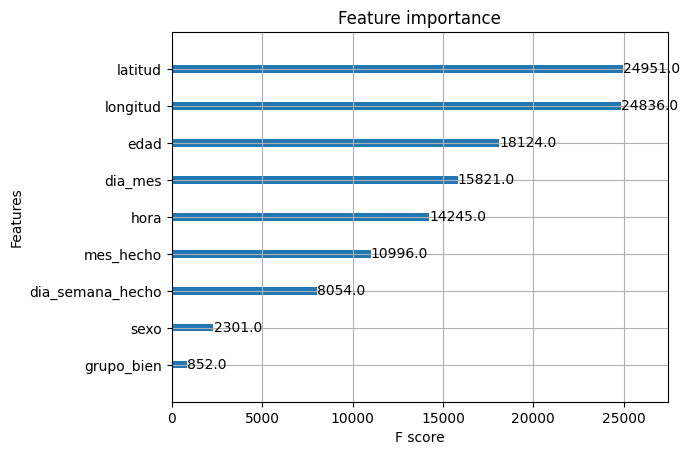

In [28]:
xgb.plot_importance(model, ax = plt.gca())

In [29]:
model.score(X_train, y_train)

0.8111636087736239

In [30]:
model.score(X_test, y_test)

0.7615139078887369

In [31]:
predict = model.predict(X_test)
predict

array([0, 0, 0, ..., 0, 0, 0])

In [32]:
from sklearn.metrics import confusion_matrix

In [33]:
confusion_matrix(y_test, predict)

array([[50253,    93,   349,   370,    51,     9,    79,    29],
       [ 3651,   885,    49,    45,     2,     1,    27,     5],
       [ 2860,    10,  1797,    18,     2,     3,     9,     0],
       [ 4388,    21,    57,  1704,     1,     2,    13,     2],
       [  841,     4,     2,     2,   421,     1,     1,     1],
       [ 1092,     3,    25,    13,     0,   374,     4,     0],
       [ 3043,    14,     9,    12,     1,     1,  1019,     1],
       [  558,     1,     0,     7,     0,     0,     0,   327]])

In [34]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN

In [35]:
scaler = StandardScaler()
hurtos_scaled = scaler.fit_transform(datos_regresion)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

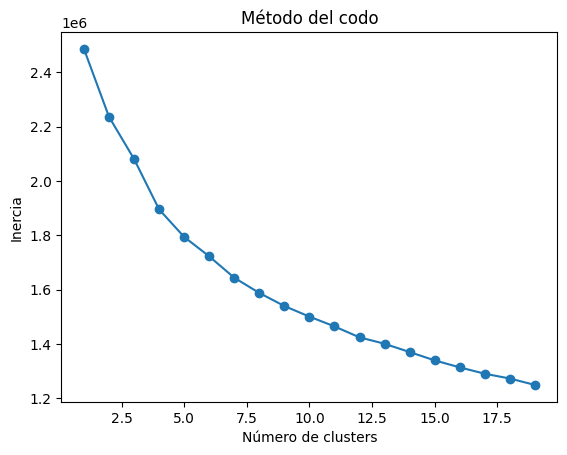

In [36]:
inertias = []
for i in range(1, 20):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(hurtos_scaled)
    inertias.append(kmeans.inertia_)

plt.plot(range(1, 20), inertias, marker='o')
plt.title('Método del codo')
plt.xlabel('Número de clusters')
plt.ylabel('Inercia')
plt.show()

In [37]:
kmeans = KMeans(n_clusters=20, random_state=0)
datos_regresion['kmeans_cluster'] = kmeans.fit_predict(hurtos_scaled)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [38]:
cluster_counts = datos_regresion['kmeans_cluster'].value_counts().sort_index()
cluster_counts

kmeans_cluster
0     12669
1     12658
2     10672
3     15111
4      4881
5     12142
6     15342
7     14977
8     15572
9     12209
10    13677
11    13082
12     7889
13     1948
14    15398
15    14313
16    15249
17    13494
18    13177
19    14078
Name: count, dtype: int64

In [39]:
hurto_barrios["kmeans_cluster"] = datos_regresion["kmeans_cluster"]

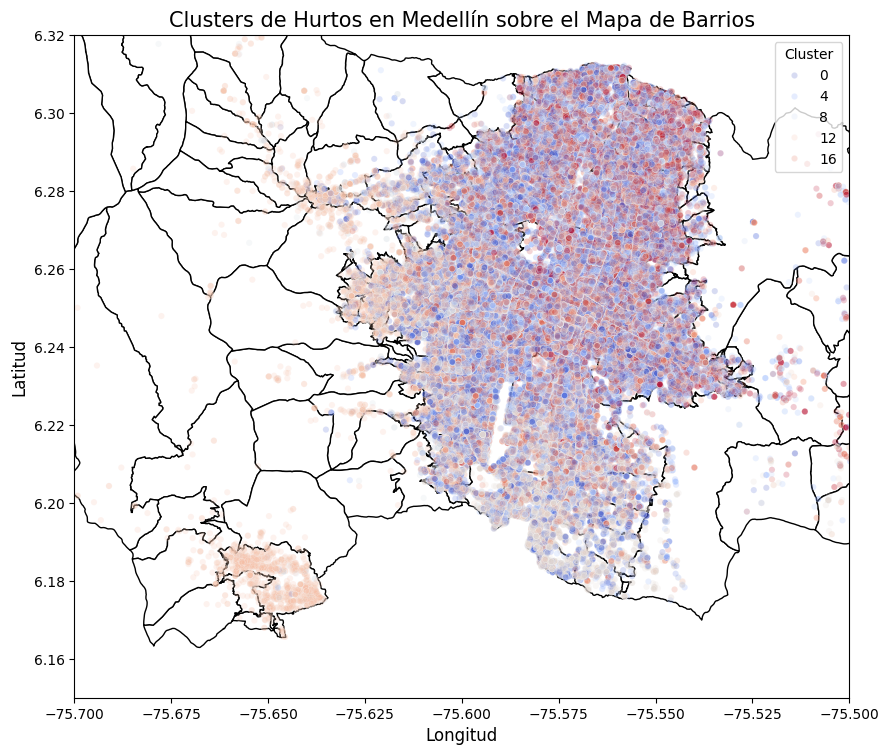

In [40]:
barrios_solo = gpd.read_file("/content/BarrioVereda_2014.shp")
# Crear un plot de los barrios de Medellín
fig, ax = plt.subplots(figsize=(10, 10))
barrios_solo.plot(ax=ax, edgecolor='black', color='white')

# Ajustar los límites del mapa
ax.set_xlim([-75.70, -75.5])
ax.set_ylim([6.15, 6.32])

# Superponer los puntos de los clusters
sns.scatterplot(
    x='longitud', y='latitud', hue='kmeans_cluster',
    data=hurto_barrios, palette='coolwarm', alpha=0.2, s=20, ax=ax
)

# Mejorar la visualización
plt.title('Clusters de Hurtos en Medellín sobre el Mapa de Barrios', fontsize=15)
plt.xlabel('Longitud', fontsize=12)
plt.ylabel('Latitud', fontsize=12)
plt.legend(title='Cluster', fontsize=10, loc='upper right')
plt.show()

                 latitud   longitud      sexo       edad  lugar_agrupado  \
kmeans_cluster                                                             
0               6.248729 -75.574453  1.000000  57.920278        0.699029   
1               6.249771 -75.579142  0.000000  34.124901        5.628298   
2               6.249541 -75.579667  1.000000  35.113193        5.640086   
3               6.255512 -75.572760  0.000132  29.648534        0.433988   
4               6.245439 -75.580505  0.222700  33.964966        1.411186   
5               6.236725 -75.575719  0.000000  31.696426        0.666365   
6               6.251972 -75.573730  1.000000  30.650893        0.426542   
7               6.260663 -75.568438  0.014956  29.592175        0.332977   
8               6.257427 -75.570501  0.000835  31.274660        0.333162   
9               6.246475 -75.598952  0.013842  30.848391        0.511098   
10              6.206245 -75.575781  0.085399  31.658551        0.694012   
11          

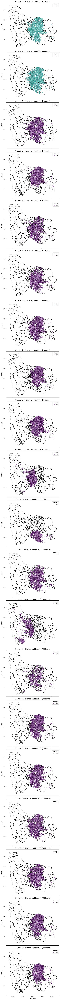


Descripción de características dentro de clusters:
                 latitud   longitud      sexo       edad  lugar_agrupado  \
kmeans_cluster                                                             
0               6.248729 -75.574453  1.000000  57.920278        0.699029   
1               6.249771 -75.579142  0.000000  34.124901        5.628298   
2               6.249541 -75.579667  1.000000  35.113193        5.640086   
3               6.255512 -75.572760  0.000132  29.648534        0.433988   
4               6.245439 -75.580505  0.222700  33.964966        1.411186   
5               6.236725 -75.575719  0.000000  31.696426        0.666365   
6               6.251972 -75.573730  1.000000  30.650893        0.426542   
7               6.260663 -75.568438  0.014956  29.592175        0.332977   
8               6.257427 -75.570501  0.000835  31.274660        0.333162   
9               6.246475 -75.598952  0.013842  30.848391        0.511098   
10              6.206245 -75.575781 

In [41]:
# Calcular estadísticas descriptivas dentro de cada cluster
cluster_descriptions = datos_regresion.groupby('kmeans_cluster').mean()
print(cluster_descriptions)

# Número de clusters
num_clusters = len(cluster_descriptions)

# Crear subplots
fig, axes = plt.subplots(num_clusters, 1, figsize=(10, num_clusters * 6), sharex=True, sharey=True)

# Asegurar que axes es una lista para iterar sobre ella
if num_clusters == 1:
    axes = [axes]

# Plotear cada cluster por separado
for i, ax in enumerate(axes):
    # Trazar el mapa de los barrios
    barrios_solo.plot(ax=ax, edgecolor='black', color='white')

    # Filtrar datos del cluster actual
    cluster_data = hurto_barrios[hurto_barrios['kmeans_cluster'] == i]

    # Superponer los puntos de los clusters
    sns.scatterplot(
        x='longitud', y='latitud', hue='kmeans_cluster',
        data=cluster_data, palette='viridis', alpha=0.6, s=20, ax=ax
    )

    ax.set_title(f'Cluster {i} - Hurtos en Medellín (K-Means)', fontsize=15)
    ax.set_xlabel('Longitud', fontsize=12)
    ax.set_ylabel('Latitud', fontsize=12)
    ax.legend(title='Cluster', fontsize=10, loc='upper right')

# Ajustar la visualización global
plt.tight_layout()
plt.show()

# Mostrar las características de cada cluster
print("\nDescripción de características dentro de clusters:")
print(cluster_descriptions)

                 latitud   longitud      sexo       edad  lugar_agrupado  \
kmeans_cluster                                                             
0               6.248729 -75.574453  1.000000  57.920278        0.699029   
1               6.249771 -75.579142  0.000000  34.124901        5.628298   
2               6.249541 -75.579667  1.000000  35.113193        5.640086   
3               6.255512 -75.572760  0.000132  29.648534        0.433988   
4               6.245439 -75.580505  0.222700  33.964966        1.411186   
5               6.236725 -75.575719  0.000000  31.696426        0.666365   
6               6.251972 -75.573730  1.000000  30.650893        0.426542   
7               6.260663 -75.568438  0.014956  29.592175        0.332977   
8               6.257427 -75.570501  0.000835  31.274660        0.333162   
9               6.246475 -75.598952  0.013842  30.848391        0.511098   
10              6.206245 -75.575781  0.085399  31.658551        0.694012   
11          

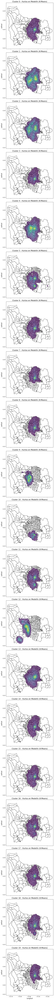


Descripción de características dentro de clusters:
                 latitud   longitud      sexo       edad  lugar_agrupado  \
kmeans_cluster                                                             
0               6.248729 -75.574453  1.000000  57.920278        0.699029   
1               6.249771 -75.579142  0.000000  34.124901        5.628298   
2               6.249541 -75.579667  1.000000  35.113193        5.640086   
3               6.255512 -75.572760  0.000132  29.648534        0.433988   
4               6.245439 -75.580505  0.222700  33.964966        1.411186   
5               6.236725 -75.575719  0.000000  31.696426        0.666365   
6               6.251972 -75.573730  1.000000  30.650893        0.426542   
7               6.260663 -75.568438  0.014956  29.592175        0.332977   
8               6.257427 -75.570501  0.000835  31.274660        0.333162   
9               6.246475 -75.598952  0.013842  30.848391        0.511098   
10              6.206245 -75.575781 

In [42]:
cluster_descriptions = datos_regresion.groupby('kmeans_cluster').mean()
print(cluster_descriptions)

# Número de clusters
num_clusters = len(cluster_descriptions)

# Crear subplots
fig, axes = plt.subplots(num_clusters, 1, figsize=(10, num_clusters * 6), sharex=True, sharey=True)

# Asegurar que axes es una lista para iterar sobre ella
if num_clusters == 1:
    axes = [axes]

# Plotear cada cluster por separado
for i, ax in enumerate(axes):
    # Trazar el mapa de los barrios
    barrios_solo.plot(ax=ax, edgecolor='black', color='white')

    # Filtrar datos del cluster actual
    cluster_data = hurto_barrios[hurto_barrios['kmeans_cluster'] == i]

    # Superponer el KDE de los clusters
    sns.kdeplot(
        x=cluster_data['longitud'], y=cluster_data['latitud'],
        fill=True, cmap='viridis', alpha=0.6, ax=ax
    )

    ax.set_title(f'Cluster {i} - Hurtos en Medellín (K-Means)', fontsize=15)
    ax.set_xlabel('Longitud', fontsize=12)
    ax.set_ylabel('Latitud', fontsize=12)

# Ajustar la visualización global
plt.tight_layout()
plt.show()

# Mostrar las características de cada cluster
print("\nDescripción de características dentro de clusters:")
print(cluster_descriptions)